<a href="https://colab.research.google.com/github/armaank/dbn/blob/main/dbn/Text2Representation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Text2Representation

Synthesizing architecture imagery with CLIP-guided generative latent space search.

## Instructions

1) Click the play button of the blocks titled "Initialization" and wait for them to finish the setup

2) Select a model and a enter a phrase in the form titled "Text2Representation"

3) Click the play button of the block titled "Text2Representation" to generate drawings from the phrase


In [1]:
%%capture
#@title Initialization - Setup
import subprocess
import re

nvcc = subprocess.check_output(["nvcc", "--version"]).decode("utf-8")
version = re.findall("release (\d+\.\d+)", nvcc)[0]

pytorch_suffix = {
    "10.0": "+cu100",
    "10.1": "+cu101",
    "10.2": "",
}

pytorch_version = "1.7.1" + (pytorch_suffix[version] if version in pytorch_suffix else "+cu110")
torchvision_version = "0.8.2" + (pytorch_suffix[version] if version in pytorch_suffix else "+cu110")
%rm -rf dbn
!git clone https://github.com/armaank/dbn.git
%cd dbn/generative

In [2]:
#@title Initialization - Download Models
%%capture
%%sh
python3 get_models.py

In [3]:
#@title Initialization - Install Requirements
#@markdown If installation fails, restart kernel and re-run previous steps
%%capture

# %cd archlectures/generative/stylclip/
%pwd

try:
  import torch
except:
  !pip install torch=={pytorch_version} -f https://download.pytorch.org/whl/torch_stable.html

try:
  import torchvision
except:
  !pip install torchvision=={torchvision_version} -f https://download.pytorch.org/whl/torch_stable.html

!pip install pytorch_pretrained_biggan pymoo==0.4.1 kornia==0.5.0 ftfy tensorboard

import argparse
import os
import torch
import numpy as np
import pickle
from pymoo.optimize import minimize
from pymoo.algorithms.so_genetic_algorithm import GA
from pymoo.factory import get_algorithm, get_decision_making, get_decomposition
from pymoo.visualization.scatter import Scatter
import torchvision
from IPython.display import Image, display
import urllib.request

%cd styleclip/
from config import get_config
from problem import GenerationProblem
from operators import get_operators

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:333: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


n_gen |  n_eval |   cv (min)   |   cv (avg)   |  n_nds  | delta_ideal  | delta_nadir  |   delta_f   
    1 |      16 |  0.00000E+00 |  0.00000E+00 |       4 |            - |            - |            -


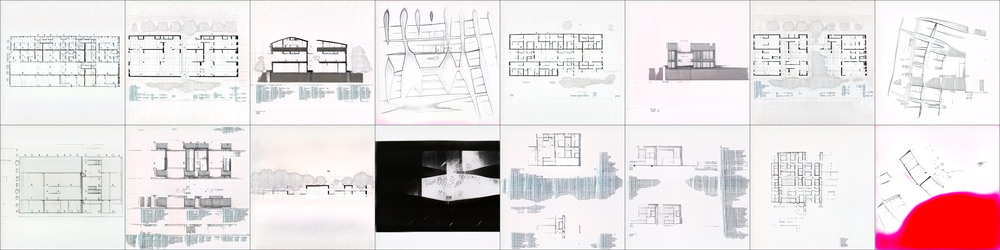

    2 |      32 |  0.00000E+00 |  0.00000E+00 |       2 |          0.0 |   0.44210526 |  0.207421049


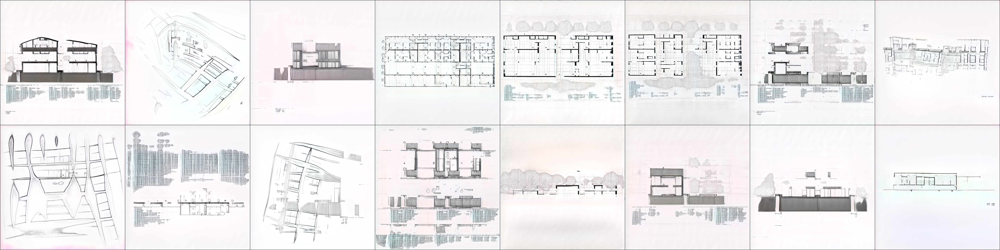

    3 |      48 |  0.00000E+00 |  0.00000E+00 |       3 |          0.0 |          0.0 |  0.121631091


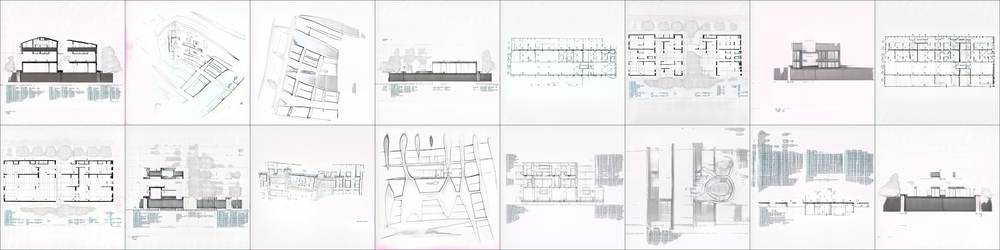

    4 |      64 |  0.00000E+00 |  0.00000E+00 |       3 |          0.0 |          0.0 |  0.00000E+00


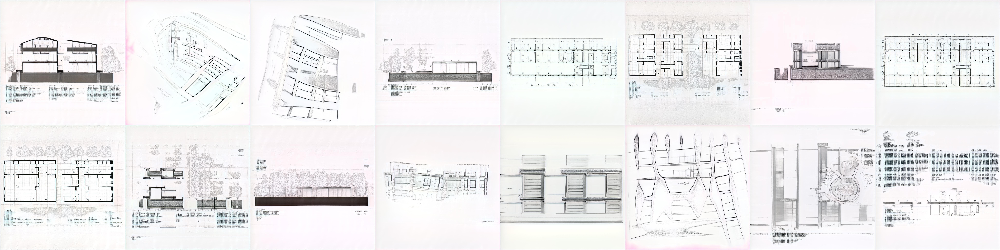

    5 |      80 |  0.00000E+00 |  0.00000E+00 |       3 |          0.0 |          0.0 |  0.00000E+00


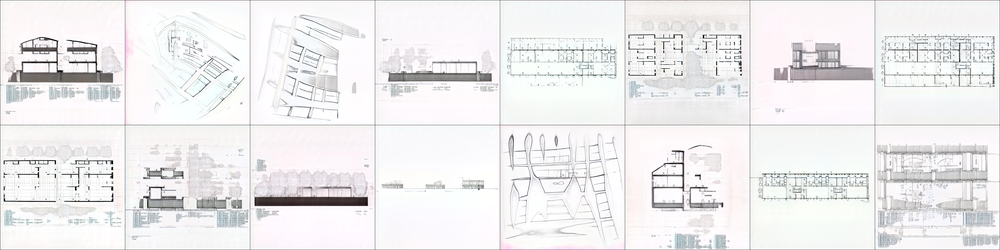

RESULT


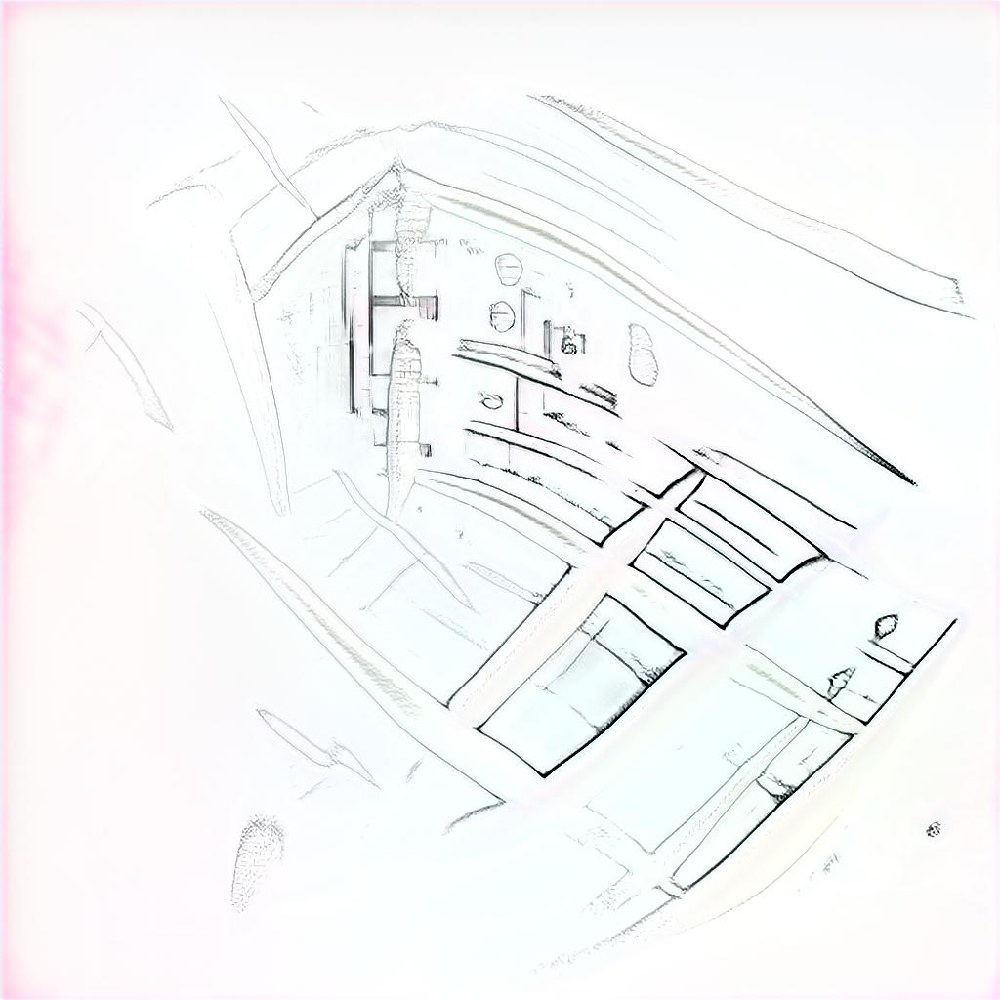

In [6]:
#@title Text2Representation


phrase = "big school for botanical sciences " #@param {type:"string"}
model = "Adaily-B" #@param ["Adaily-A", "Adaily-B"]
save_each =  1#@param {type:"number"}
generations = 5 #@param {type:"number"}

target = phrase
config = model
if model == 'Adaily-B':
    config = 'Adaily_B'
if model == 'Adaily-A':
  config = 'Adaily_A'

config = argparse.Namespace(
    config=config,
    target=target,
    device="cuda",
    generations=generations,
    save_each=save_each,
    tmp_folder="./tmp"
)

vars(config).update(get_config(config.config))

iteration = 0
def save_callback(algorithm):
    global iteration
    global config

    iteration += 1
    if iteration % config.save_each == 0 or iteration == config.generations:
        if config.problem_args["n_obj"] == 1:
            sortedpop = sorted(algorithm.pop, key=lambda p: p.F)
            X = np.stack([p.X for p in sortedpop])  
        else:
            X = algorithm.pop.get("X")
        
        ls = config.latent(config)
        ls.set_from_population(X)

        with torch.no_grad():
            generated = algorithm.problem.generator.generate(ls, minibatch=config.batch_size)
            name = "genetic-it-%d.jpg" % (iteration) if iteration < config.generations else "genetic-it-final.jpg"

            if config.task == "txt2img":
                algorithm.problem.generator.save(generated, os.path.join(config.tmp_folder, name))
                display(Image(os.path.join(config.tmp_folder, name)))
            elif config.task == "img2txt":
                print("\n".join(generated))
        

problem = GenerationProblem(config)
operators = get_operators(config)

if not os.path.exists(config.tmp_folder): os.mkdir(config.tmp_folder)

algorithm = get_algorithm(
    config.algorithm,
    pop_size=config.pop_size,
    sampling=operators["sampling"],
    crossover=operators["crossover"],
    mutation=operators["mutation"],
    eliminate_duplicates=True,
    callback=save_callback,
    **(config.algorithm_args[config.algorithm] if "algorithm_args" in config and config.algorithm in config.algorithm_args else dict())
)

res = minimize(
    problem,
    algorithm,
    ("n_gen", config.generations),
    save_history=False,
    verbose=True,
)


pickle.dump(dict(
    X = res.X,
    F = res.F,
    G = res.G,
    CV = res.CV,
), open(os.path.join(config.tmp_folder, "genetic_result"), "wb"))


if config.problem_args["n_obj"] == 1:
    X = np.atleast_2d(res.X)
else:
    try:
        result = get_decision_making("pseudo-weights", [0, 1]).do(res.F)
    except:
        print("Warning: cant use pseudo-weights")
        result = get_decomposition("asf").do(res.F, [0, 1]).argmin()
    X = res.X[result]
    X = np.atleast_2d(X)

print("="*50)
print("RESULT")
print("="*50)


ls = config.latent(config)
ls.set_from_population(X)

with torch.no_grad():
    generated = problem.generator.generate(ls)

if config.task == "txt2img":
    problem.generator.save(generated, os.path.join(config.tmp_folder, "output.jpg"))
    display(Image(os.path.join(config.tmp_folder, "output.jpg")))
elif config.task == "img2txt":
    print(generated)